<a href="https://colab.research.google.com/github/iiineco/analysis/blob/master/work/hmm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

隠れマルコフモデル（HMM: Hidden Markov models）
====================

隠れマルコフモデルを利用して、動画における状態遷移を確認してみる。

python のライブラリ hmmlearn を利用。

https://hmmlearn.readthedocs.io/en/latest/

動画のフレーム変換は OpenCV を利用。

https://docs.opencv.org/4.0.1/dd/d43/tutorial_py_video_display.html


In [0]:
from google.colab import drive
drive.mount('/content/drive')

!ls

In [0]:
video_path = '/content/drive/My Drive/Colab Notebooks/data/Pexels Videos 1722593.mp4'

In [0]:
# 処理対象の動画の確認｜Pexels からダウンロード
from IPython.display import HTML
from base64 import b64encode

mp4 = open(video_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [0]:
import cv2 as cv
# Video I/Oが有効化されているか確認
# print(cv.getBuildInformation())

In [0]:
import cv2 as cv

# 動画の読み込み
cap = cv.VideoCapture(video_path)

# 動画が読み込めたか確認
print(cap.isOpened())

# 動画のフレーム数
print(cap.get(cv.CAP_PROP_FRAME_COUNT))
# 動画の秒数
print(cap.get(cv.CAP_PROP_FRAME_COUNT) / cap.get(cv.CAP_PROP_FPS))

True
555.0
18.5


True
(1080, 1920, 3)


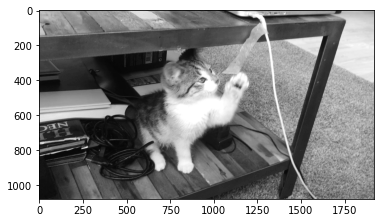

In [0]:
from matplotlib import pyplot as plt

# 読み込んでフレーム変換
ret, frame = cap.read()

# 結果には 1 枚目のフレームが格納される
print(ret)
print(frame.shape)

# 1 枚目のフレームを表示（グレー変換）
src = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
plt.imshow(src, "gray")

(55, 20736)

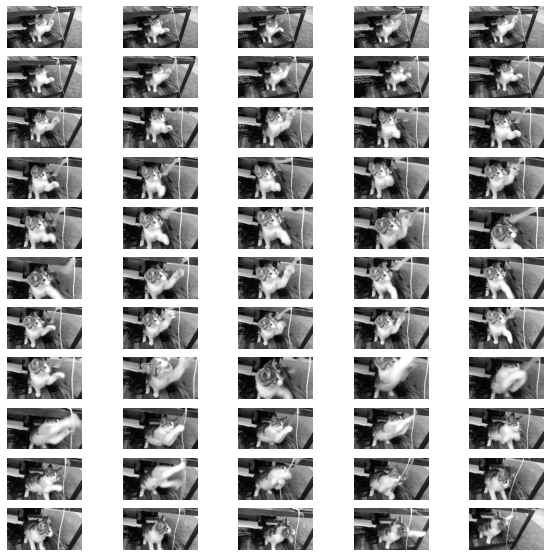

In [0]:
import numpy as np
from pylab import rcParams
from numpy.linalg import svd, matrix_rank

# 学習に使用するフレームを表示して確認
rcParams['figure.figsize'] = 10,10
fig = plt.figure()
def view_subplot(_frame, i):
    # 表示する（パラメータは、行サイズ、列サイズ、表示順）
    ax = fig.add_subplot(11, 5, i) 
    ax.axis('off')
    plt.imshow(_frame, "gray")

# 1 フレームごとの処理
def get_frame(_frame_i, _view_i):
    # フレーム順を指定
    cap.set(cv.CAP_PROP_POS_FRAMES, _frame_i)
    # フレーム取得
    ret, _frame = cap.read()
    _frame = cv.cvtColor(_frame, cv.COLOR_BGR2GRAY)
    # メモリ対策にデータサイズを削減
    _frame = cv.resize(_frame , (int(_frame.shape[1]*0.1), int(_frame.shape[0]*0.1)))
    # 表示する
    view_subplot(_frame, _view_i)
    # 1 次元の行に変換して行を追加
    return np.ravel(_frame)

# メモリ対策にデータサイズを削減( 20736 は cv.resize した結果で確認)
imgs = np.empty((0, 20736), int)
# 555 -> 55 フレームにしてみる
for i in range(0, 55):
    frame = get_frame(i * 10, i+1)
    imgs = np.append(imgs, np.array([frame]), axis=0)

imgs.shape

In [0]:
# Google Colabに hmmlearn をインストールする
!pip install hmmlearn


In [0]:
import numpy as np
from hmmlearn import hmm
#from sklearn.hmm import GaussianHMM

# n_components: 状態数の種類, covariance_type: 共分散のタイプ（full だと時間がかかりすぎる）
model = hmm.GaussianHMM(n_components=3)

# 学習
model.fit(imgs)

GaussianHMM(algorithm='viterbi', covariance_type='diag', covars_prior=0.01,
            covars_weight=1, init_params='stmc', means_prior=0, means_weight=0,
            min_covar=0.001, n_components=3, n_iter=10, params='stmc',
            random_state=None, startprob_prior=1.0, tol=0.01,
            transmat_prior=1.0, verbose=False)

### 結果を確認してみる

学習した画像の時系列の確認。

[Text(0, 0, 'Tail'), Text(0, 0, 'Head')]

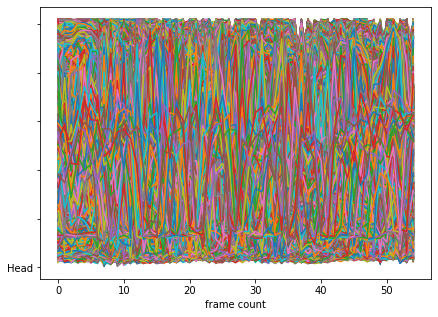

In [0]:
# 画像の確認
rcParams['figure.figsize'] = 7, 5

plt.plot(imgs)
plt.xlabel('frame count')
ax = plt.gca()
ax.set_yticklabels(['Tail', 'Head'])

([<matplotlib.axis.YTick at 0x7f1f90873080>,
 <a list of 2 Text major ticklabel objects>)

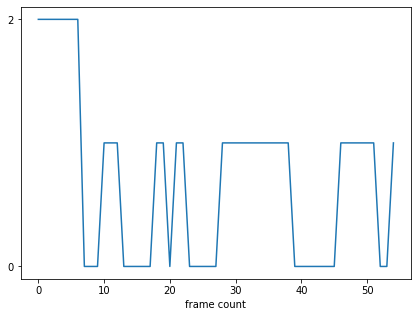

In [0]:
# 学習結果の確認
L, Z = model.decode(imgs)

rcParams['figure.figsize'] = 7, 5
plt.plot(Z)
plt.xlabel('frame count')
plt.yticks((0, 2))

以下の 3 状態に分類できたっぽい...？
55 回分のデータだから信頼性は低そう。

* おとなしめ
* 待ち
* 激しめ

In [0]:
model.score(imgs)

-5770439.54959806

In [0]:
# 推測された遷移確率
model.transmat_ 

array([[0.73913043, 0.26086957, 0.        ],
       [0.20833333, 0.79166667, 0.        ],
       [0.14285714, 0.        , 0.85714286]])

In [0]:
# 推定された出力確率 (正規乱数の平均)
model.means_ 

array([[ 66.04347826,  67.60869565,  69.91304348, ..., 102.73913043,
        117.52173913, 112.7826087 ],
       [ 46.96      ,  50.24      ,  47.76      , ..., 126.56      ,
        121.24      , 123.76      ],
       [184.        , 177.14285714, 181.42857143, ..., 137.71428571,
        119.71428571, 120.        ]])

[2 2 2 2 2 0 0 1 1 1 0 0 0 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 1
 0 0]


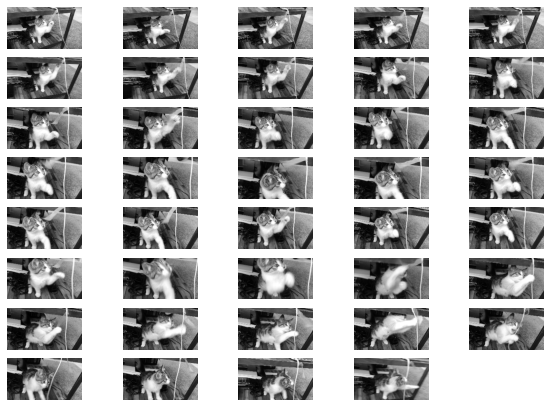

In [0]:
# 画像表示初期化
rcParams['figure.figsize'] = 10,10
fig = plt.figure()

imgs = np.empty((0, 20736), int)
for i in range(0, 39):
     frame = get_frame(i * 14, i+1)
     imgs = np.append(imgs, np.array([frame]), axis=0)

# 予測
print(model.predict(imgs))


フレーム順を 10 の倍数から 14 の倍数に変更した場合も予測の状態遷移がだいたい同じっぽい。

* 10 の倍数：学習データ
* 14 の倍数：テストデータ

テストデータは違う動画で試した方が良さそう。

In [0]:
# 後処理として動画を解放
cap.release()
cv.destroyAllWindows()
